In [1]:
%reload_ext autoreload
%autoreload 2

import sys; sys.path.append('..')
from src.data_utils import get_dataset_imagenet, imagenet_classes
from jupyter_preproc import smoothen, probs_to_softacc
import numpy as np
import time
import matplotlib.pyplot as plt
rng = np.random.default_rng(5)
import seaborn as sns
import matplotlib as mpl
from plot_utils import stacksimple

In [2]:
ls

cifar-numsamples.ipynb           jan14_fishing_for_samples.ipynb
cifar100-lr.ipynb                jan7_imagnet_smooth.ipynb
data/                            jan8_preproc_imagenet_v2.ipynb
imagenet_playground.ipynb        test-imagenet-a.ipynb
jan12-cifar-compareto.ipynb      test-imagenet-r.ipynb
jan13_fishing_for_samples.ipynb  test-imagenet-sketch.ipynb
jan13_imagenet-synthetic.ipynb   test-imagenet-synthetic.ipynb
jan14-cross-similarity.ipynb     test-imagenet-v2.ipynb


In [3]:
gname = 'imagenet_v2'
dataset = get_dataset_imagenet(gname)
ytest = dataset.targets
classes = imagenet_classes

In [6]:
v2_npz_path = '/home/jupyter/dist-shift/processed/imagenet/resnet50/resnet50_imagenet_v2.npz'
v2_scores_path = '/home/jupyter/dist-shift/scores/imagenet/resnet50/resnet50_imagenet_v2_scores.npz'

In [7]:
data_v2 = np.load(v2_npz_path, mmap_mode='r')
scores_v2 = np.load(v2_scores_path, mmap_mode='r')

In [8]:
print([key for key in data_v2.keys()])

['x', 'all_acc', 'x_err', 'all_acc_err', 'points', 'points_err', 'labels', 'labels_err', 'probs', 'freqs']


In [9]:
print([key for key in scores_v2.keys()])

['ent_nonmono', 'ent_thresh', 'ent_easy', 'acc_nonmono', 'acc_thresh', 'acc_easy']


In [17]:
arr = -scores_v2['acc_nonmono']
print(arr)
arr.argsort()

[ 0.02980334  0.2088679   0.36229414 ...  0.19223952 -0.15482349
  0.35285891]


array([6790,  960, 4931, ..., 3308, 3301, 4999])

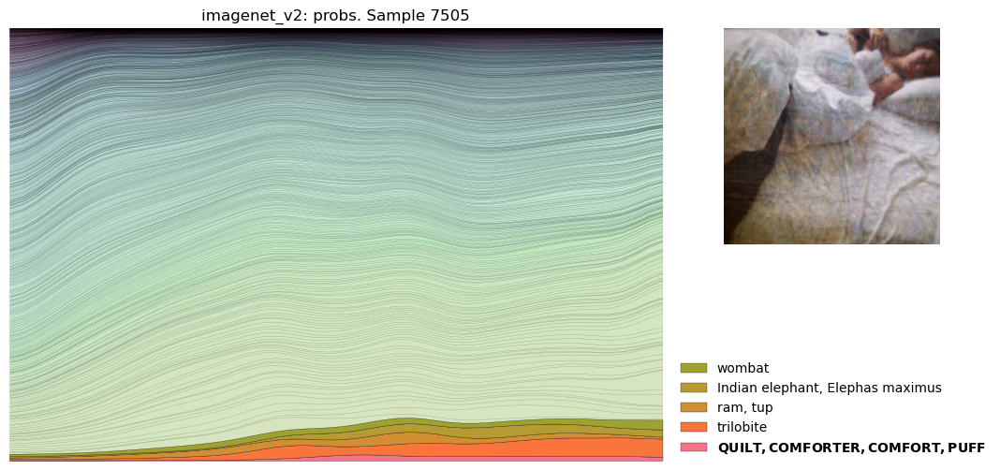

In [11]:
## parameters
t = 'probs'
smooth = True
num_gridpts = 50 # num pts on x-axis
sigma = 2.0

## generate plot
xkey = 'x'

## random plot
# i = rng.choice(range(10000)) # random image index
i = 7505
sns.reset_defaults()
mpl.rcParams['font.family'] = 'sans-serif'

res = smoothen(data_v2, xkey, t, i)

xx = res[f'{xkey}_grid']
yy = res[f'{t}_smooth']
    
f = stacksimple(i, xx, yy, dataset, classes) # the actual plot
f.axes[0].set_title(f'{gname}: {t}. Sample {i}');
plt.show()


In [12]:
## parameters
t = 'probs'
smooth = True
num_gridpts = 50 # num pts on x-axis
sigma = 2.0

## generate plot
xkey = 'x'

## random plot
# i = rng.choice(range(10000)) # random image index

sns.reset_defaults()
mpl.rcParams['font.family'] = 'sans-serif'



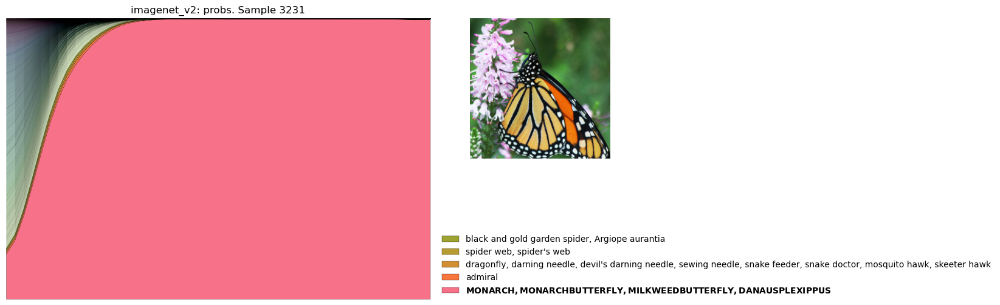

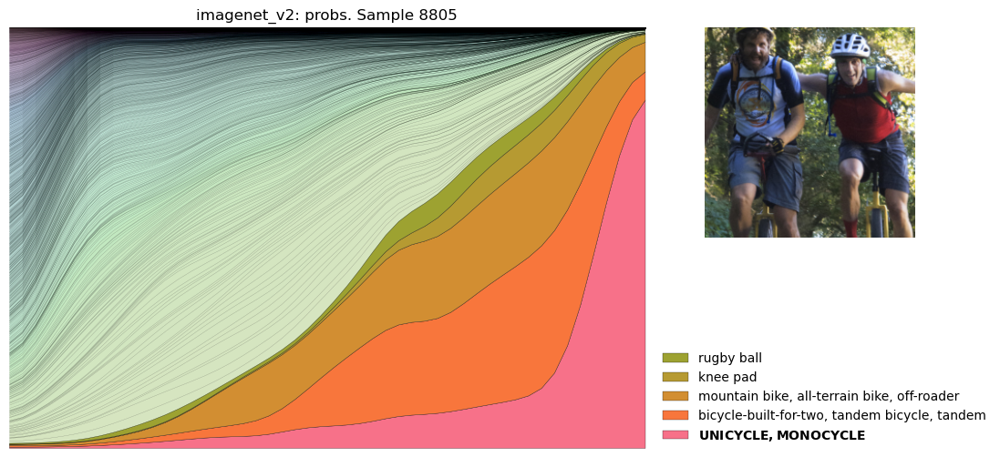

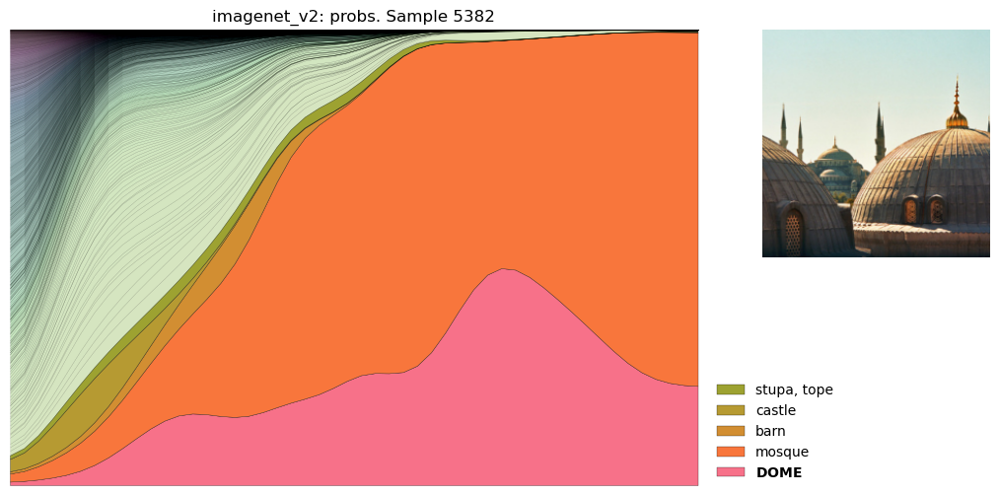

In [23]:
for i in [3231, 8805, 5382]:
    res = smoothen(data_v2, xkey, t, i)

    xx = res[f'{xkey}_grid']
    yy = res[f'{t}_smooth']
    
    f = stacksimple(i, xx, yy, dataset, classes) # the actual plot
    f.axes[0].set_title(f'{gname}: {t}. Sample {i}')
    plt.show()

[6790  960 4931 3287 6254 9455 3018 1304 5105 9675 6406 8883 7682  582
 7074 8841 1538 4521 6798 3341 8842 8507 9920 8150 1480 3012 8579 3272
 5382 3328]


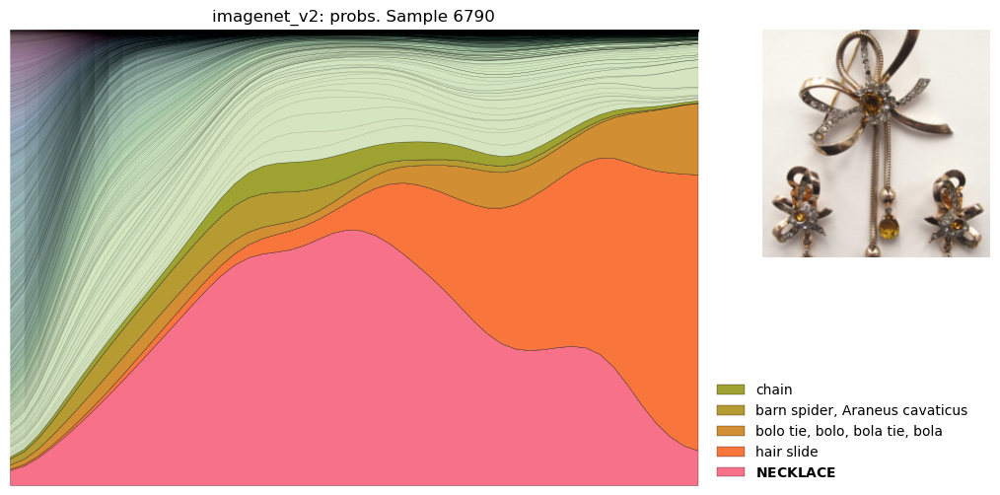

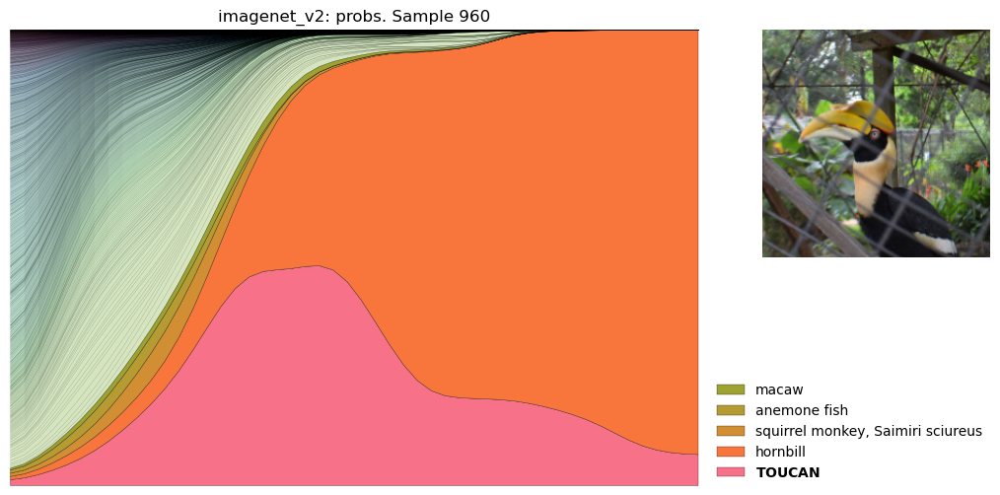

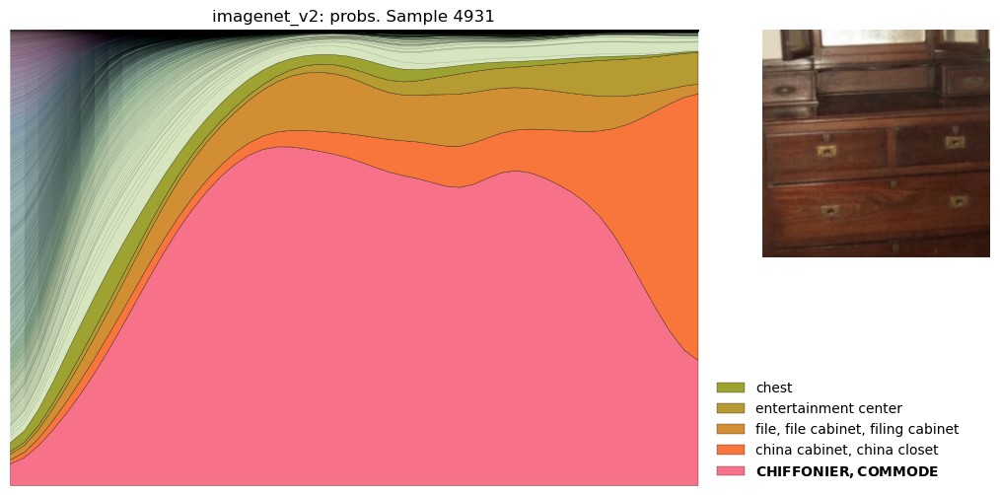

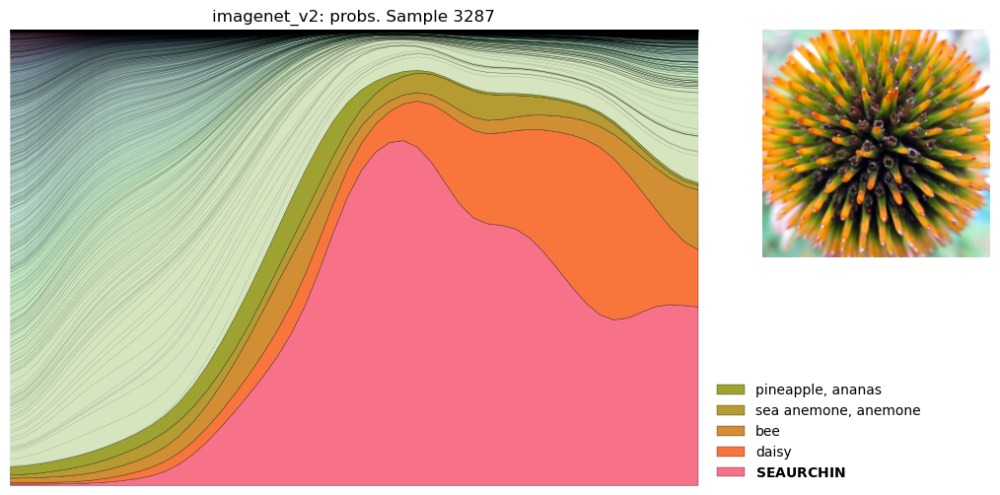

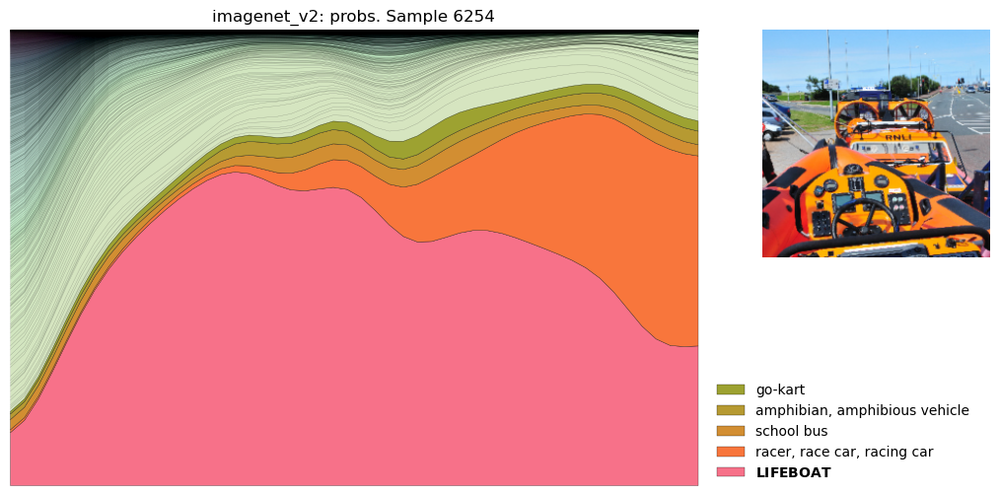

...

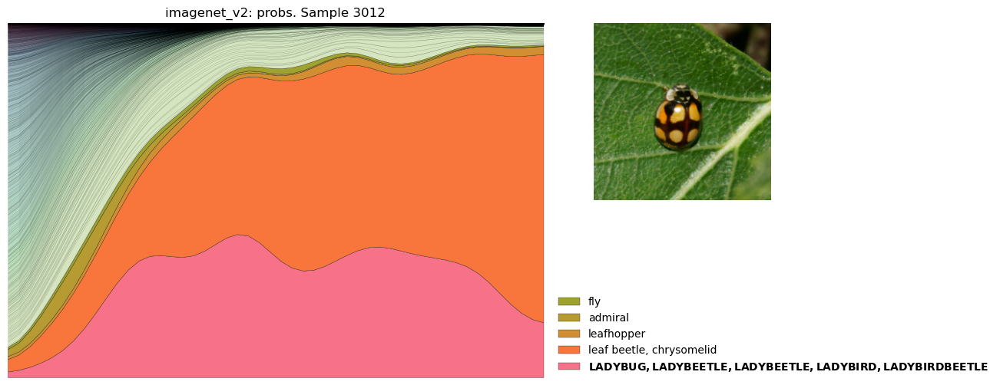

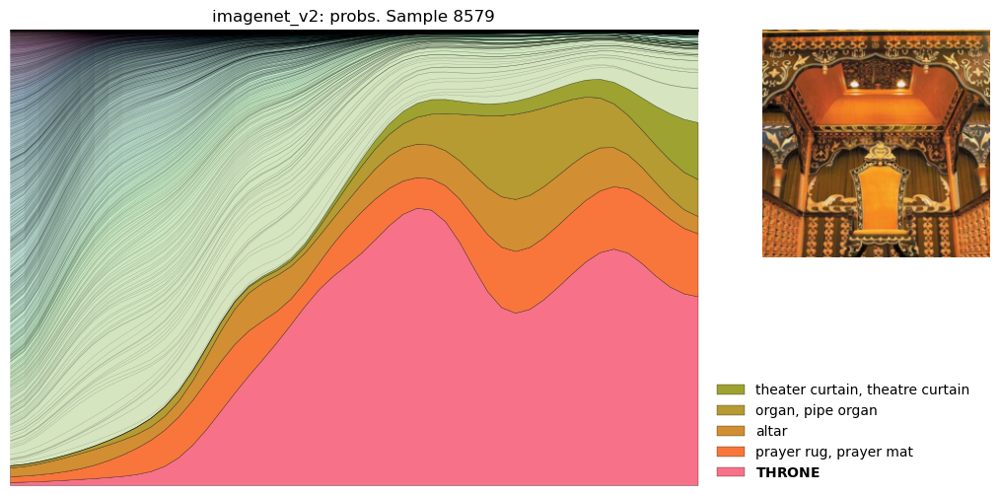

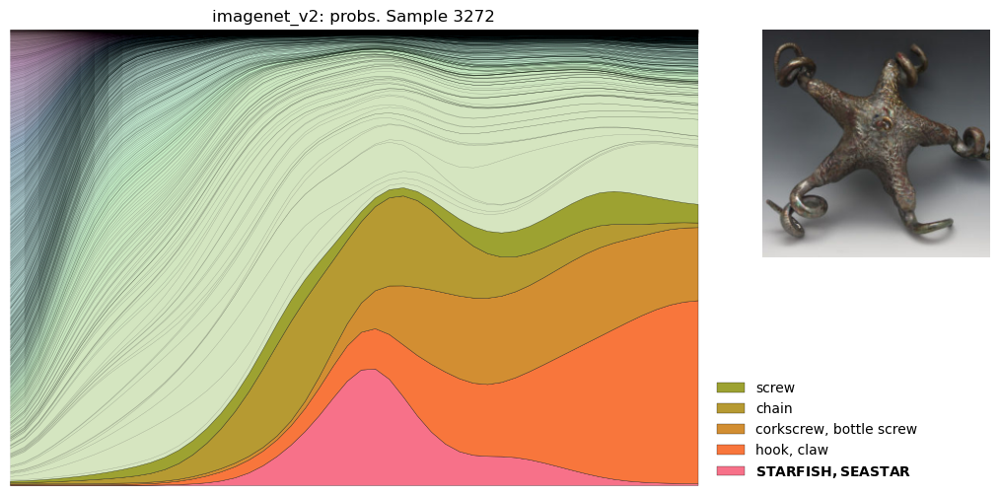

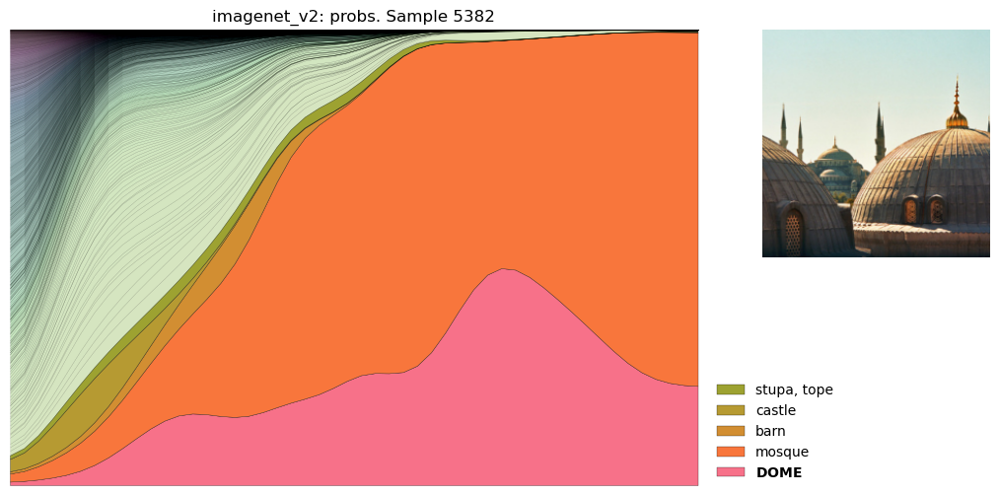

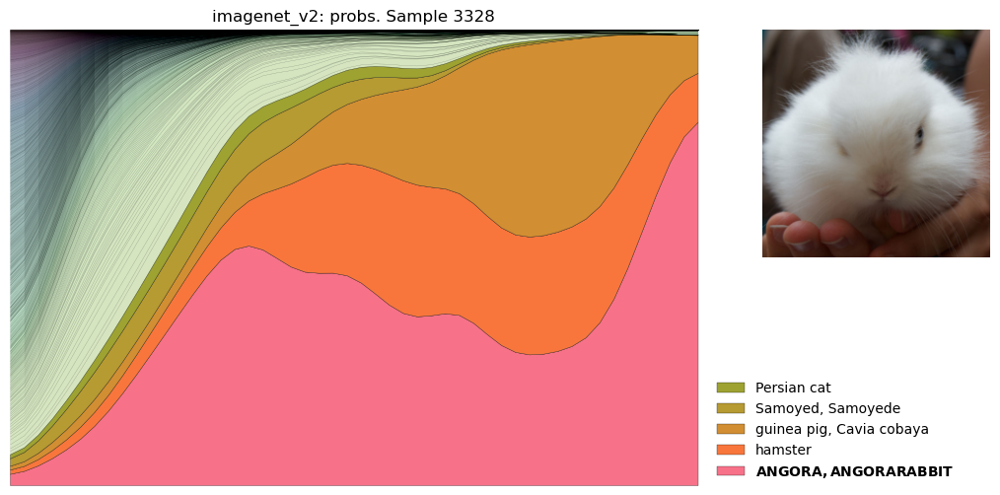

In [22]:
arr = -scores_v2['acc_nonmono']
idxs = arr.argsort()[0:30]
print(idxs)

for i in idxs:
    res = smoothen(data_v2, xkey, t, i)

    xx = res[f'{xkey}_grid']
    yy = res[f'{t}_smooth']
    
    f = stacksimple(i, xx, yy, dataset, classes) # the actual plot
    f.axes[0].set_title(f'{gname}: {t}. Sample {i}')
    plt.show()
    

In [ ]:
for i in scores_v2['ent_nonmono'].argsort()[30:60]:
    res = smoothen(data_v2, xkey, t, i)

    xx = res[f'{xkey}_grid']
    yy = res[f'{t}_smooth']
    
    f = stacksimple(i, xx, yy, dataset, classes) # the actual plot
    f.axes[0].set_title(f'{gname}: {t}. Sample {i}')
    plt.show()

In [ ]:
for i in scores_v2['ent_nonmono'].argsort()[60:90]:
    res = smoothen(data_v2, xkey, t, i)

    xx = res[f'{xkey}_grid']
    yy = res[f'{t}_smooth']
    
    f = stacksimple(i, xx, yy, dataset, classes) # the actual plot
    f.axes[0].set_title(f'{gname}: {t}. Sample {i}')
    plt.show()

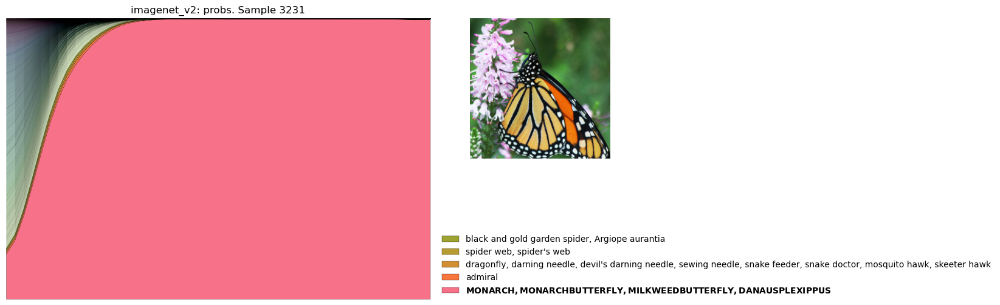

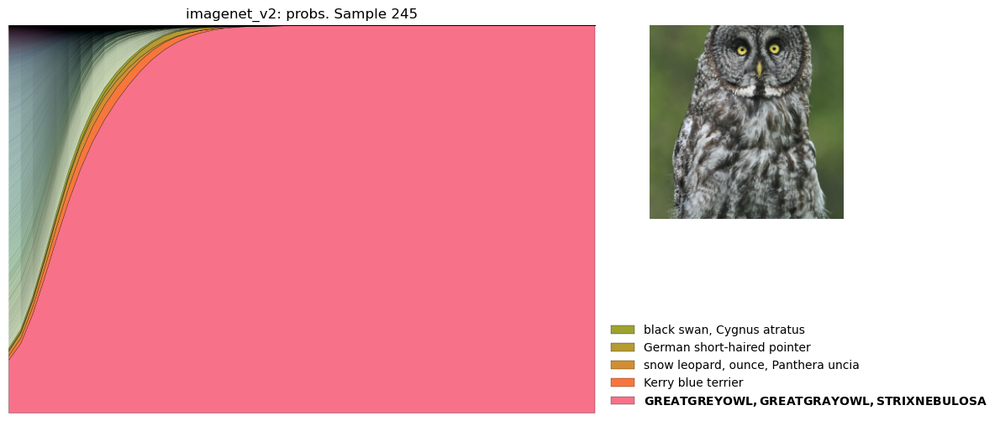

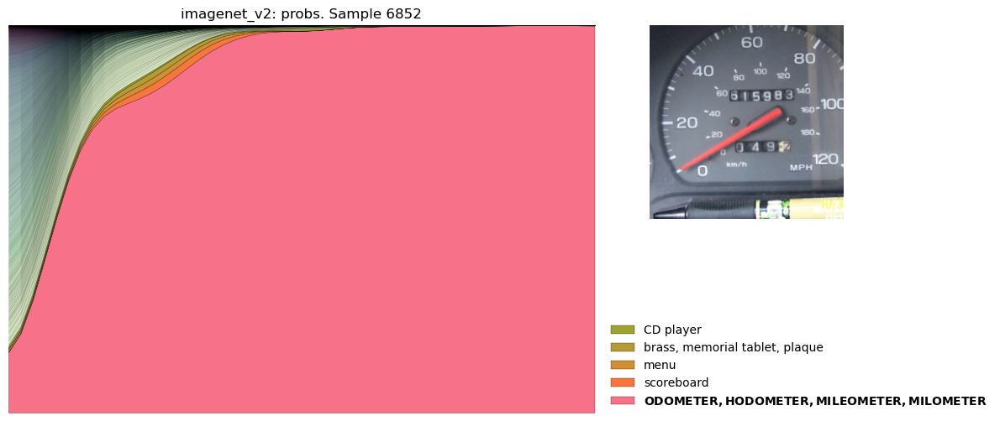

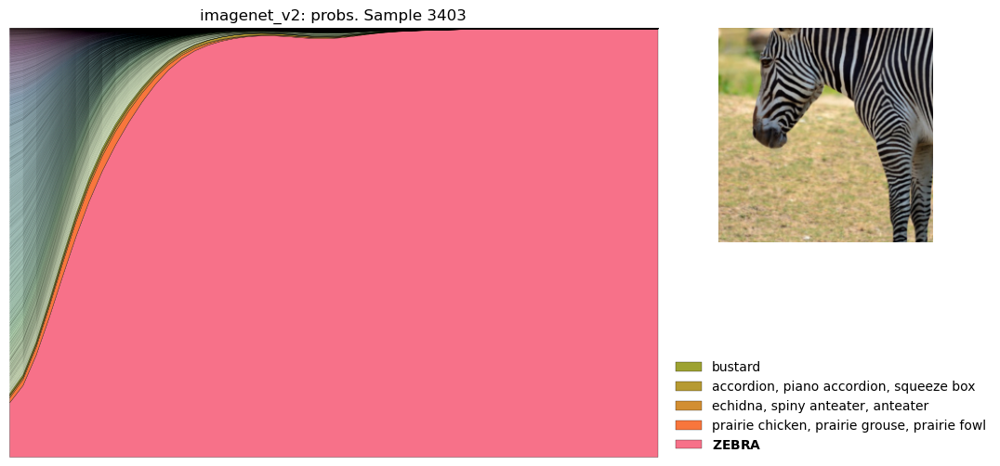

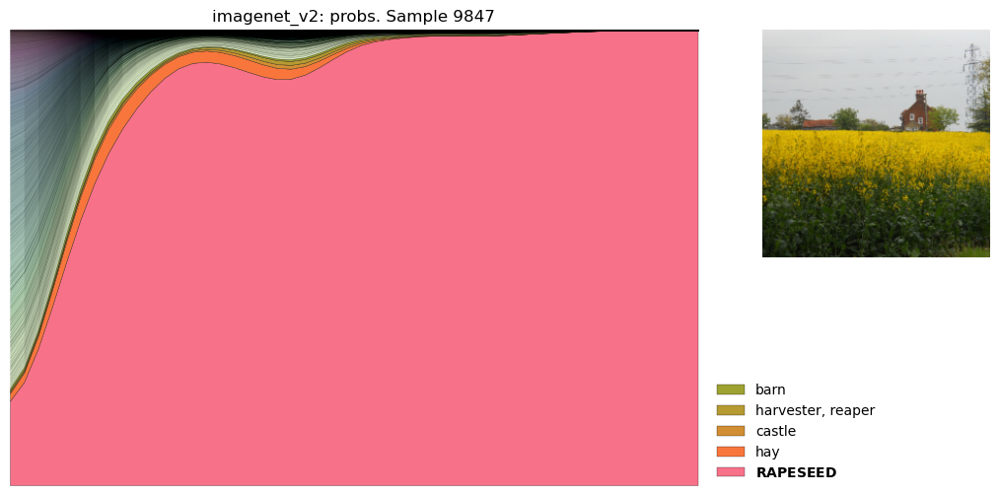

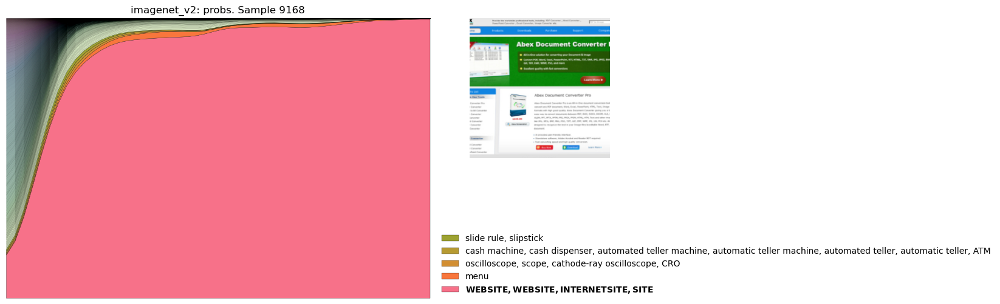

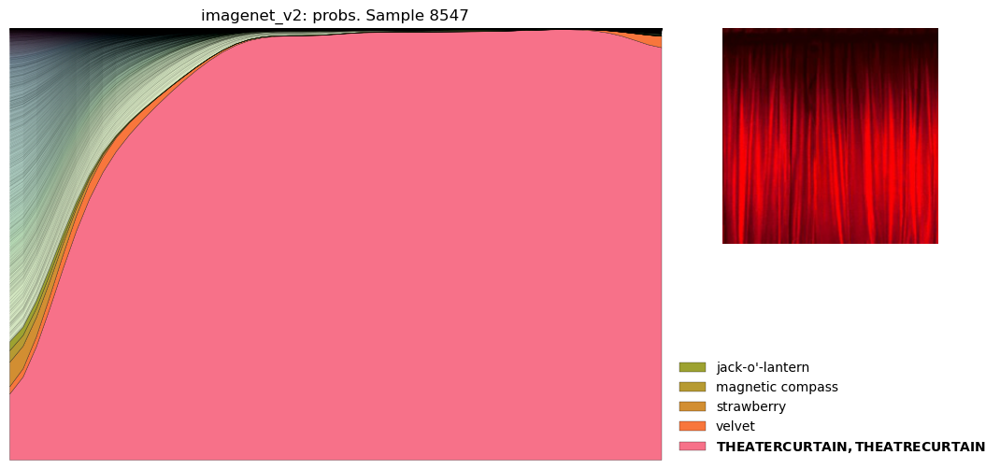

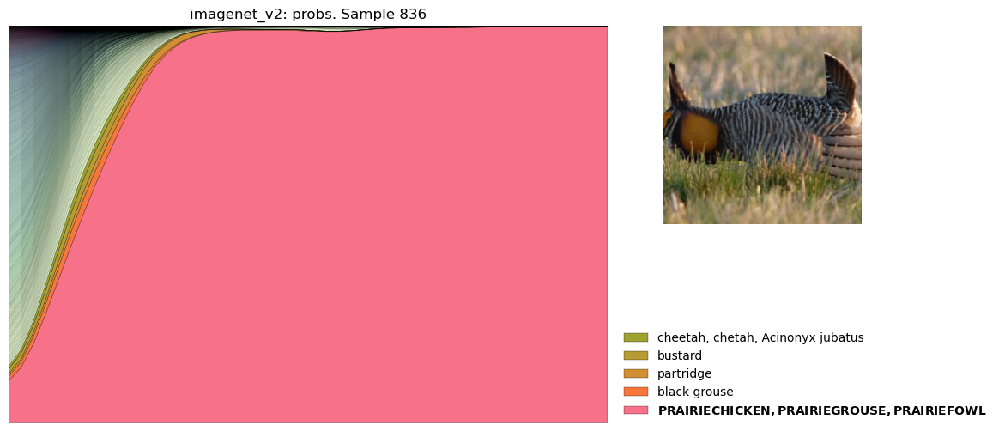

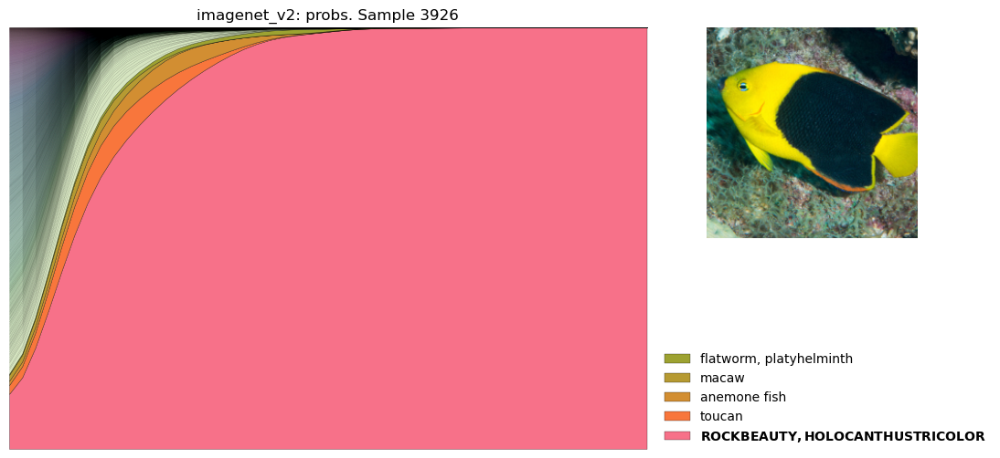

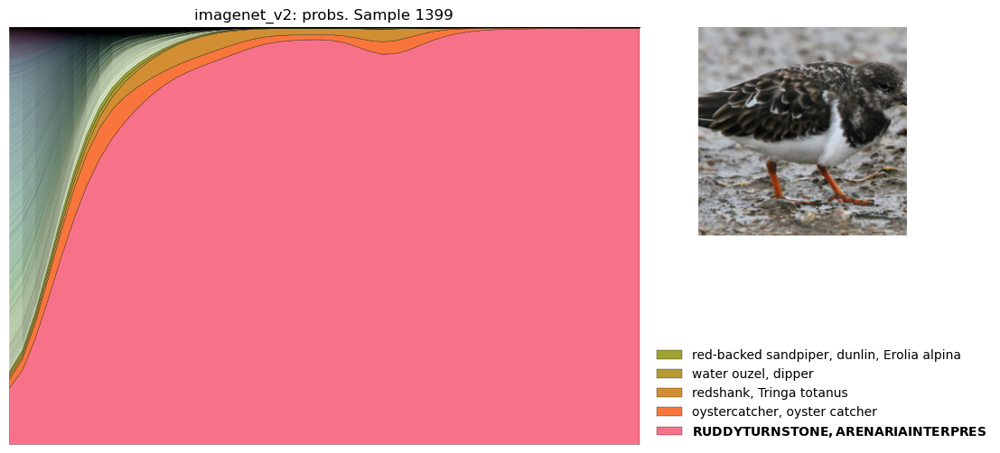

In [14]:
for i in (-scores_v2['acc_easy']).argsort()[:10]:
    res = smoothen(data_v2, xkey, t, i)

    xx = res[f'{xkey}_grid']
    yy = res[f'{t}_smooth']
    
    f = stacksimple(i, xx, yy, dataset, classes) # the actual plot
    f.axes[0].set_title(f'{gname}: {t}. Sample {i}')
    plt.show()